# Банки — Сегментация пользователей по потреблению

## Материалы:
* [Презентация](https://disk.yandex.ru/i/9bGxp05uoZU0yQ)
* [Дашборд]()

<a id="toc"></a>

## Оглавление

1. [Описание проекта](#describe)
2. [Обзор данных](#view)
3. [Описание данных](#data)
4. [Предобработка данных](#prepare)
   1. [Работа с дубликатами](#double)
   2. [Работа с пропусками](#nan)
5. [Исследовательский анализ данных (EDA)](#eda)
   1. [Сегментация клиентов](#cluster)
   2. [Анализ причин оттока](#churn)
6. [Работа с гипотезами](#hipotes)
   1. [Гипотезы о равенстве групп](#h1)
   2. [Статистические гипотезы](#h2)
7.  [Выводы и рекомендации](#resume)
    1.  [Общие выводы](#r1)
    2.  [Рекомендации](#r2)

<a id="describe"></a>

## Описание проекта

**Задача**

Нам необходимо проанализировать клиентов регионального банка и сегментировать пользователей по количеству потребляемых продуктов, а именно:

- Провести исследовательский анализ данных.
- Сегментировать пользователей на основе данных о количестве потребляемых продуктов.
- Сформулируем и проверим статистические гипотезы:
  -  Проверить гипотезу различия дохода между теми клиентами, которые пользуются двумя продуктами банка, и теми, которые пользуются одним.
  -  Сформулировать и проверить статистическую гипотезу относительно представленных данных.

На основании гипотез, а также анализа сегментированных данных нам необходимо подготовить рекомендации для заказчика с целью уменьшения оттока клиентов, внедрения дополнительных продуктов, возможного проведения промоакций.

<a id="view"></a>

## Обзор данных

[К оглавлению](#toc)

In [1]:
import pandas as pd
import numpy as np
import time
import datetime
import os

import seaborn as sns
#from sklearn.preprocessing import StandardScaler
#from sklearn.model_selection import train_test_split

#from sklearn.linear_model import LogisticRegression
#from sklearn.ensemble import RandomForestClassifier
#from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
#from sklearn.metrics import accuracy_score, precision_score, recall_score
#from scipy.cluster.hierarchy import dendrogram, linkage
#from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score


import IPython
from IPython.display import display
import plotly

import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import pylab

from scipy import stats as st
import scipy.stats as stats
from statsmodels.stats.proportion import proportions_ztest
import math as mth

#import re

import warnings
#warnings.filterwarnings("ignore") 

#import plotly.io as pio
#pio.renderers.default='notebook'

#import csv
#import requests
#from bs4 import BeautifulSoup

import requests
from urllib.parse import urlencode
import json

pd.set_option('chained_assignment', None)
pd.set_option("max_colwidth", 200) # задаем максимальное количество отображаемых символов поля 
pd.set_option("display.max_columns", 15) # столбцов много, поэтому устанавливаем отображение всех, с запасом


In [2]:
# проверяем вторую цифру номера версии библиотеки plotly,
# если версия старая, обновляем её до последней.

pl_version = plotly.__version__
if int(pl_version.split('.')[1]) > 4:
    print('Версия plotly актуальная для проекта. Идём дальше.')
else:
    print('Старая версия plotly, которая не поддерживает атрибут text_auto. Обновим библиотеку!')
    try:
        %pip install plotly -U --user
        print('Библиотека обновлена. Перезапустим ядро!')
        app = IPython.Application.instance()
        app.kernel.do_shutdown(True)
    except:
        print('Что-то пошло не так!')

Версия plotly актуальная для проекта. Идём дальше.


In [3]:
# Работа с ссылкой на csv-файл


base_url = 'https://cloud-api.yandex.net/v1/disk/public/resources/download?'
public_key = 'https://disk.yandex.ru/d/JVAJ9uxtV1uydQ'  

file_name = 'bank_dataset.csv'

# Получаем загрузочную ссылку
final_url = base_url + urlencode(dict(public_key=public_key))
try:
    response = requests.get(final_url)
    download_url = response.json()['href']
    download_response = requests.get(download_url)
    if response.status_code == download_response.status_code == 200: # если есть доступ к репе по сети:
        df = pd.read_csv(download_url)  # считываем файл в df
        print('Доступ к данным успешно получен из сети.')
    else:
        print('Скорее всего, Ссылка не доступна.')
except:
    print('Не удалось установить соединение для скачивания файла. Попробуем найти в корневой директории...')
    try:
        df = pd.read_csv(file_name)
        print('Файл с данными успешно найден в текущем каталоге.')
    except:
        print('Что-то пошло не так. Или нет файла в каталоге, или нет доступа к репозиторию по сети.')
        raise FileNotFoundError('Не удается прочитать файлы')


Не удалось установить соединение для скачивания файла. Попробуем найти в корневой директории...
Файл с данными успешно найден в текущем каталоге.


In [4]:
display(df.head())
print('-----------')
df.info()

,userid,score,City,Gender,Age,Objects,Balance,Products,CreditCard,Loyalty,estimated_salary,Churn
0,15677338,619,Ярославль,Ж,42,2,NaN,1,1,1,101348.88,1
1,15690047,608,Рыбинск,Ж,41,1,83807.86,1,0,1,112542.58,0
2,15662040,502,Ярославль,Ж,42,8,159660.80,3,1,0,113931.57,1
3,15744090,699,Ярославль,Ж,39,1,NaN,2,0,0,93826.63,0
4,15780624,850,Рыбинск,Ж,43,2,125510.82,1,1,1,79084.10,0


-----------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   userid            10000 non-null  int64  
 1   score             10000 non-null  int64  
 2   City              10000 non-null  object 
 3   Gender            10000 non-null  object 
 4   Age               10000 non-null  int64  
 5   Objects           10000 non-null  int64  
 6   Balance           6383 non-null   float64
 7   Products          10000 non-null  int64  
 8   CreditCard        10000 non-null  int64  
 9   Loyalty           10000 non-null  int64  
 10  estimated_salary  10000 non-null  float64
 11  Churn             10000 non-null  int64  
dtypes: float64(2), int64(8), object(2)
memory usage: 937.6+ KB


<a id="data"></a>

## Описание данных

[К оглавлению](#toc)

Датасет содержит данные о клиентах банка «Метанпром». Банк располагается в Ярославле и областных городах: Ростов Великий и Рыбинск.

Столбцы датасета:

- `userid` — идентификатор пользователя,
- `score` — баллы кредитного скоринга,
- `City` — город,
- `Gender` — пол,
- `Age` — возраст,
- `Objects` — количество объектов в собственности,
- `Balance` — баланс на счёте,
- `Products` — количество продуктов, которыми пользуется клиент,
- `CreditCard` — есть ли кредитная карта,
- `Loyalty` — активный клиент,
- `estimated_salary` — заработная плата клиента,
- `Churn` — ушёл или нет.

<a id="prepare"></a>

## Предобработка данных

[К оглавлению](#toc)

Для начала приведем названия всех столбцов к нижнему регистру:

In [5]:
df.columns = [x.lower() for x in df.columns]

<a id="double">

### Работа с дубликатами

[К оглавлению](#toc)

Посмотрим на возможные явные дубликаты:

In [6]:
print(f'''Количество явных дубликатов: {df.drop("userid", axis = 1).duplicated().sum()}, 
что составляет {round(df.drop("userid", axis = 1).duplicated().sum() / df.shape[0] * 100,2)}% от общего количества записей''')

Количество явных дубликатов: 0, 
что составляет 0.0% от общего количества записей


Приведем пол клиента к бинарному виду:

In [7]:
df['gender'].replace({'Ж': 0, 'М': 1}, inplace=True)

df['gender'].unique()

array([0, 1], dtype=int64)

<a id="nan">

### Работа с пропусками

[К оглавлению](#toc)

Подсчитаем количество пропущенных значений:

In [8]:
df.isna().sum()

userid                 0
score                  0
city                   0
gender                 0
age                    0
objects                0
balance             3617
products               0
creditcard             0
loyalty                0
estimated_salary       0
churn                  0
dtype: int64

Посмотрим на столбец `balance`, в котором есть пропущенные значения. Посмотрим на распределение этого столбца:

In [9]:
df['balance'].describe()

count      6383.000000
mean     119827.493793
std       30095.056462
min        3768.690000
25%      100181.975000
50%      119839.690000
75%      139512.290000
max      250898.090000
Name: balance, dtype: float64

In [10]:
fig = px.histogram(
    df['balance'],
    title='Распределение баланса на счете клиента',
    marginal = 'box',
    labels={'value': 'Сумма на счете', 'variable': 'Баланс на счете'},
    width = 1200,
    height = 600
)
# отдельно меняем отображение при наведении курсора count на Количество
fig.for_each_trace(lambda t: t.update(hovertemplate=t.hovertemplate.replace("count", "Количество")))

fig.update_layout(
                    xaxis_title='Сумма на счете',
                    yaxis_title='Количество',
                    margin=dict(l=20, r=0, t=50, b=50),
                    showlegend=False
                    )
fig.show()

По распределению видно, что баланс на счетах клиентов распределен близко к нормальному.

Посмотрим на распределение всех столбцов по наличию или отсутствию данных в `balance`:

In [42]:
def make_plots(df=pd.DataFrame, features=list, rows=int, cols=int, title='', width=1000, height=500, subplot_titles=[]):
    '''
    Функция строит графики из библиотеки plotly по строкам и столбцам
    ## Parametres:
    `df` - датафрейм, features - список признаков (столбцов),
    `rows` - количество строк,
    `cols` - количество столбцов,
    `title` - общий заголовок,
    `width` - ширина общего графика (по умолчанию 1000),
    `height` - высота общего графика (по умолчанию 500),
    `subplot_titles` - список заголовков для каждого графика
    '''

    fig = make_subplots(rows=rows, cols=cols, subplot_titles=subplot_titles)

    for i, feature in enumerate(df[features]):
        trace = go.Histogram(
            x=df[feature],
            hovertemplate="Значение параметра=%{x}<br>Частота=%{y}",
            nbinsx=50,
            name=feature)
        fig.update_traces(legendgrouptitle_text='Признаки')
        if rows < 6:
            fig.append_trace(trace, (i)%rows+1, (i)%cols+1)
        else:
            fig.append_trace(trace, (i)%rows+1, (i)%cols+1) if i < 6 else fig.append_trace(trace, (i)%rows+2, (i)%cols+1)
        
    fig.update_layout(title=title, width=width, height=height)

    fig.show()

# вызываем эту функцию и строим график
make_plots(
    df.query('balance.isna()', engine='python'), 
    df.drop(['balance', 'userid'], axis=1).columns,
    rows=2,
    cols=5,
    title='Распределение признаков у клиентов без баланса')

In [12]:
make_plots(
    df.query('balance > 0'), 
    df.drop(['balance', 'userid'], axis=1).columns, 
    rows=2,
    cols=5,
    title='Распределение признаков у клиентов с балансом')

**Промежуточный вывод:**

* Распределения очков скоринга, наличию кредитной карты, пола, возраста, количества объектов, активности клиента (`loyalty`) и оттока примерно сопоставимы у клиентов с пропущенным значением баланса и заполненным.
* Пропущенных значений баланса нет только в Ростове Великом (столбец `city`).
* Количество продуктов у клиентов с пропущенным значением баланса в основном 2, а у клиентов с заполненным значением баланса - в основном 1 (столбец `products`).

Посмотрим на распределение значений датасета только из Яросавля и Рыбинска:

In [13]:
make_plots(
    df.query('balance > 0 and city != "Ростов Великий"'), 
    df.drop(['balance', 'userid'], axis=1).columns, 
    rows=2,
    cols=5,
    title='Распределение признаков у клиентов с балансом только из Ярославля и Рыбинска'
)

Графики очень похожи по распределениям на значения по Ярославлю и Рыбинску для клиентов с пропущенными значениями баланса, за исключением количества продуктов `products`.

Можно сделать предположение, что пропущенные значения баланса у клиентов из Рыбинска и Ярославля, которые в основном имеют 2 продукта банка. Возможно, второй продукт это зарплатный проект или кредитная карта, из-за чего баланс просто не выгрузился в датасет.

Оставим пропуски незаполненными. 

<a id="eda"></a>

## Исследовательский анализ данных

[К оглавлению](#toc)

Обратим внимание на уникальные значения некоторых столбцов (возраста клиента и всех категориальных), посмотрим, есть ли явные аномалии:

In [14]:
for column in ['city', 'age', 'gender', 'objects', 'products', 'creditcard', 'loyalty', 'churn']:
    print(f'Уникальные значения столбца `{column}`: {np.sort(df[column].unique())}')

Уникальные значения столбца `city`: ['Ростов Великий' 'Рыбинск' 'Ярославль']
Уникальные значения столбца `age`: [18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41
 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65
 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 88 92]
Уникальные значения столбца `gender`: [0 1]
Уникальные значения столбца `objects`: [ 0  1  2  3  4  5  6  7  8  9 10]
Уникальные значения столбца `products`: [1 2 3 4]
Уникальные значения столбца `creditcard`: [0 1]
Уникальные значения столбца `loyalty`: [0 1]
Уникальные значения столбца `churn`: [0 1]


Аномалий не выявлено.

Теперь посмотрим на распределение всех данных датафрейма:

In [15]:
make_plots(
    df, 
    df.drop(['userid'], axis=1).columns,
    rows=6,
    cols=2,
    width=1200,
    height=1500,
    title='Распределение признаков у всех клиентов',
    subplot_titles=['score', '', 'products', 'city','gender','creditcard', 'loyalty', 'age', 'objects', 'estimated_salary', 'churn', 'balance']
)

In [16]:
df_box = df[['score', 'age', 'balance', 'estimated_salary']]

fig = go.Figure()

for i in df_box.columns:
        fig.add_trace(go.Box(x=df_box[i], name=i,  boxpoints='all', marker_size=1, jitter=0.3,  boxmean=True))
        fig.update_xaxes(title_text="Распределение значений, лог. шкала", type="log")

fig.update_layout(
    title='Размах распределения небинарных величин, логарифмическая шкала',
    width=1500,
    height=600
)

fig.show()


Посмотрим, распределены ли небинарные данные нормально при помощи "Квантиль-Квантиль" графика:

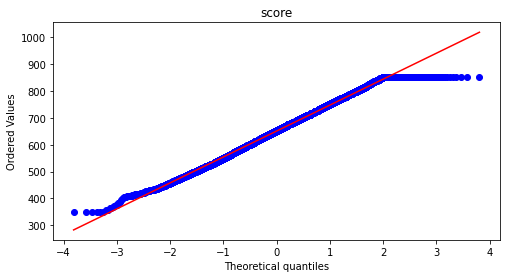

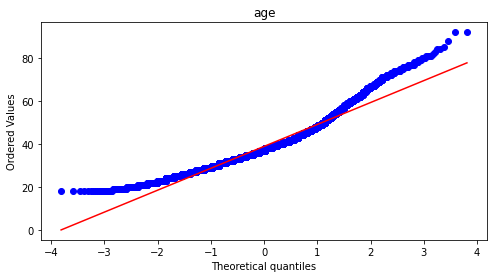

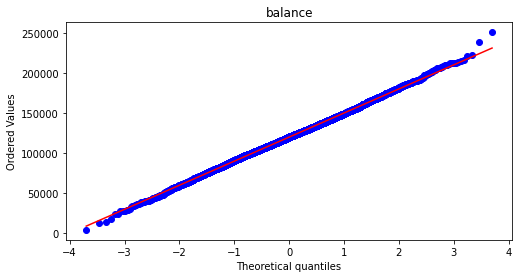

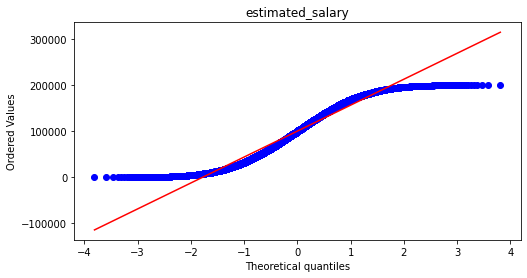

In [17]:
for feature in df_box.columns:
    plt.figure(figsize=(8,4))
    if feature == 'balance':
        stats.probplot(df_box.query('~balance.isna()',engine='python')[feature], dist="norm", plot=plt)
    else:    
        stats.probplot(df_box[feature], dist="norm", plot=plt)
    plt.title(feature)
    plt.show()


**Выводы:**

* Скоринг, баланс и возраст распределены максимально близко к теоретическому нормальному распределению, за исключением "хвостов".

Построим матрицу коррелляций всех признаков:

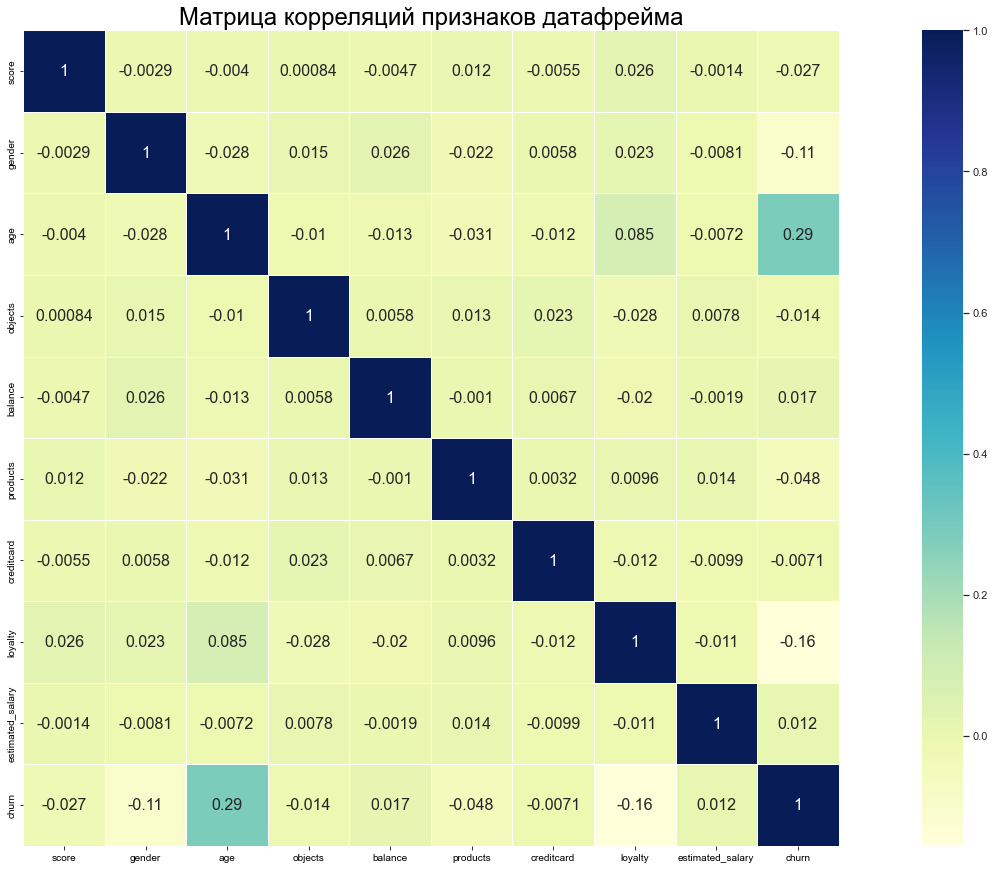

In [18]:
def corr_matrix(df=pd.DataFrame(), title=''):
    '''
    Функция построения тепловой карты-матрицы корреляций
    ##Параметры:
    `df` - объект класса pd.DataFrame(),
    `title` - Заголовок графика, тип - str.
    '''

    fig, ax = plt.subplots(figsize=(30,15))
    sns.set(rc = {'figure.figsize':(30,15)})

    sns.heatmap(
        df.corr(), 
        annot=True, 
        square=True, 
        linewidths=.5, 
        cmap='YlGnBu',
        annot_kws={"fontsize":16}
        )
    ax.set_title(title, fontsize =24)

    sns.set(font_scale=2)
    plt.show()

corr_matrix(df.drop(['userid'], axis=1), 'Матрица корреляций признаков датафрейма')

**Выводы:**

* Распределение скоринга, возраста и баланса (`score`, `age`, `balance`) носит нормальный характер.
* В основном клиенты имеют один или два продукта (сильно реже - три или четыре).
* Клиентов из Ярославля примерно в два раза больше, чем из каждого другого города.
* По полу и лояльности примерно паритет (мужчин чуть больше среди клиентов).
* Среди клиентов с кредитными картами более чем в 2 раза больше тех, что без них.
* Подавляющее большинство клиентов имеют объекты в собственности.
* Средняя заработная плата клиентов примерно равномерна.
* 20% клиентов попали в отток.
* Наблюдается слабая корреляция всех признаков (слабая положительная корреляция между возрастом клиента и фактом оттока).

<a id="cluster"></a>

### Сегментация клиентов

[К оглавлению](#toc)

Предварительный анализ данных показал, что по количеству продуктов клиенты в основном разделяются на тех, кто пользуется одним и тех, кто пользуется двумя. По 3 и 4 продукта пользуется крайне малое количество клиентов. 

Посмотрим на долю клиентов по количеству продуктов:

In [19]:
df_count_products = df.pivot_table(
    index='products',
    values='userid',
    aggfunc='count'
)
df_count_products['%'] = round(df_count_products['userid'] / df.shape[0] * 100, 2)
df_count_products

,userid,%
products,,
1,5084,50.84
2,4590,45.90
3,266,2.66
4,60,0.60


По 3 и 4 продукта имеет всего 3.26% клиентов. Создадим две группы клиентов: тех, кто пользуется одним продуктом и тех, кто пользуется больше одного (двумя, тремя и четыремя):

In [20]:
df_one_product = df.query('products == 1')
df_multi_product = df.query('products > 1')

print(f'Размеры выборок: Один продукт - {df_one_product.shape[0]}, Несколько продуктов - {df_multi_product.shape[0]}')

Размеры выборок: Один продукт - 5084, Несколько продуктов - 4916


Мы сегментировали клиентов на две практически равные группы по количеству продуктов банка.

Посмотрим на распределения непрерывных величин в обеих группах:

In [21]:
features_not_binar = ['city', 'objects', 'score', 'age', 'balance', 'estimated_salary']
features_binar = ['gender', 'creditcard', 'loyalty', 'churn']

def multi_prod_hist(df_one_product=pd.DataFrame(), df_multi_product=pd.DataFrame(), features=[], title='', barmode='relative', opacity=0.7, name_1='', name_2=''):
    '''
    Функция построения совместных гистограмм для одного продукта и нескольких.
    ## Параметры:
    `df_one_product` - датафрейм для одного продукта,
    `df_multi_product` - датафрейм для нескольких продуктов,
    `features` - список признаков, по которым будут строиться гистограммы,
    `title` - заголовок,
    `barmode` - тип отображения, по умолчанию = relative. принимает одно из следующих значений: overlay, stack, group,
    `opacity` - прозрачность графиков
    `name_1` - подпись легенды для первого распределения
    `name_ц` - подпись легенды для второго распределения
    '''

    fig = make_subplots(rows=2, cols=2)

    for i, feature in enumerate(features):
        fig_2 = go.Figure()
        fig_2.add_trace(go.Histogram(x=df_one_product[feature], name=feature+' - '+name_1,  marker_color='rgb(0, 204, 150)'))
        fig_2.add_trace(go.Histogram(x=df_multi_product[feature], name=feature+' - '+name_2,  marker_color='rgb(99, 110, 250)'))

        fig_2.update_traces(opacity=opacity)
        fig_2.update_layout(barmode=barmode, title=title+' `'+feature+'`')
        fig_2.show()

multi_prod_hist(df_one_product, df_multi_product, features_not_binar, 'Распределение небинарных значений', 'overlay', name_1='один продукт', name_2='несколько продуктов')

In [22]:
# Теперь отобразим распределение бинарных значений датафрема в разрезе количества продуктов

multi_prod_hist(df_one_product, df_multi_product, features_binar, 'Распределение бинарных значений', 'group', name_1='один продукт', name_2='несколько продуктов')

In [23]:
# Для удобства добавим столбец в датафрейм с категориями 1 и multi (то есть 2 и более):

df['products_category'] = df['products'].replace([2,3,4], 'multi')


for i in ['score', 'age', 'balance', 'estimated_salary']:
    fig = go.Figure()

    fig = px.box(df, x=i, color='products_category', title='Распределение размаха клиентов столбца `'+i+'`')
    fig.show()

**Выводы по графикам:**

*По небинарным признакам:*
* В Ростове Великом больше клиентов с одним продуктом.
* Среди клиентов с одним продуктов больше тех, к кого нет объектов недвижимости или такой объект всего один.
* Клиентов с одним продуктом с низким скорингом незначительно больше, чем клиентов с несколькими продуктами.
* Клиентов от 40 до 65 лет с одним продуктом больше, чем с несколькими.
* У людей с несколькими продуктами распределение значений баланса на счету сопоставим с клиентами, у которых один продукт.
* По заработной плате примерный паритет среди клиентов обеих групп.

*По бинарным признакам:*
* Лояльных клиентов больше, у которых несколько продуктов.
* В отток попадают в основном клиенты с одним продуктом.


<a id="churn"></a>

### Анализ причин оттока

[К оглавлению](#toc)

Построим матрицы корреляций для каждой когорты:

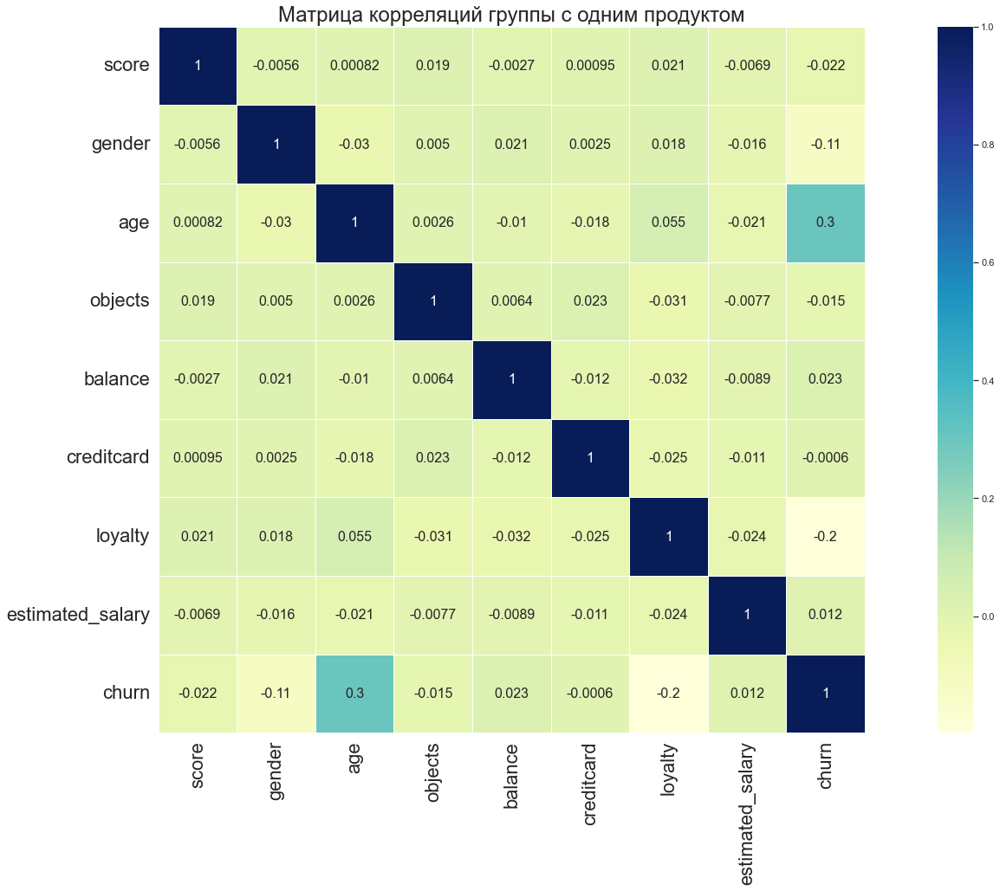

In [24]:
corr_matrix(df_one_product.drop(['userid', 'products'], axis=1), 'Матрица корреляций группы с одним продуктом')

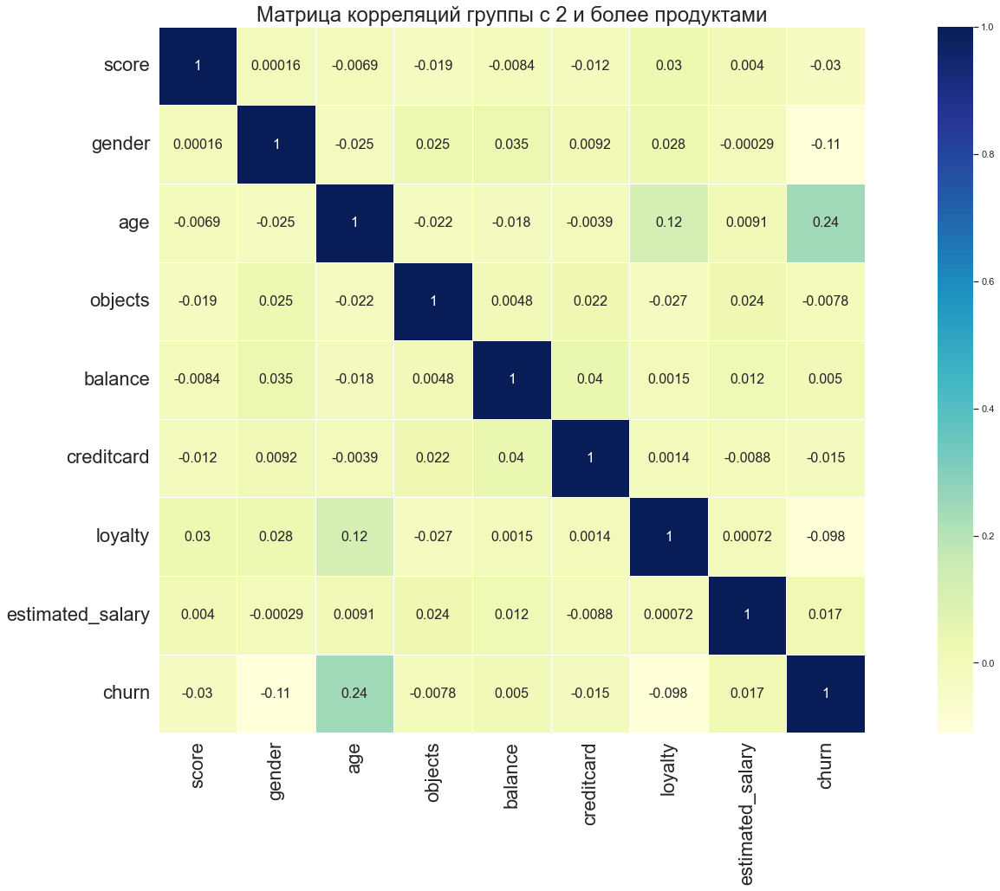

In [25]:
corr_matrix(df_multi_product.drop(['userid', 'products'], axis=1), 'Матрица корреляций группы с 2 и более продуктами')

**Вывод:**

Матрицы корреляций схожи с основной. Для группы, где клиенты имеют один продукт банка, положительная корреляция возраста и оттока чуть выше (0.3), чем у группы с бОльшим количеством продуктов.

Поскольку больше всего оттока мы наблюдаем у группы, где клиенты имеют один продукт.

Рассмотрим эту группу подробнее. Посмотрим на распределение всех величин у клиентов с одним продуктом, попавших в отток и сравним их с клиентами, у которых больше 1 продукта и не попавшие в отток:

In [26]:
multi_prod_hist(
    df_one_product.query('churn == 1'), 
    df.query('products > 1 and churn == 0'), 
    df.drop(['userid', 'products', 'products_category', 'churn'], axis=1).columns, 
    'Распределение значений для клиентов с одним продуктом в оттоке и клиентов с несколькими без оттока -', 
    'overlay', 0.6, 
    name_1='один продукт - в оттоке', 
    name_2='несколько продуктов - не в оттоке')

**Выводы:**

* Меньше всего оттока в Рыбинске (как в абсолютных значениях, так и, очевидно, в относительных).
* По гендерному признаку больше в отток попадают женщины, чем мужчины (хотя мужчин среди клиентов немного больше).
* Среди клиентов, использующих один продукт и попавших в отток больше всего людей в возрасте 45-47 (примерное мат. ожидание), тогда как среди клиентов, не попавших в отток и пользующихся более 1 продукта банка больше всего 35-37 (примерное мат. ожидание). На гистограммах распределения возраста `age` видна зависимость, соответствующая матрице корреляций оттока от возраста.
* Среди количества объектов недвижимости, баланса на счете, размера зарплаты и наличию кредитной карты пропорции примерно схожи.
* А вот среди лояльных клиентов оттока заметно меньше, чем среди нелояльных.

Посмотрим на распределения данных для клиентов по признаку оттока:

In [27]:
multi_prod_hist(
    df.query('churn == 1'), 
    df.query('churn == 0'),
    df.drop(['userid', 'products', 'products_category', 'churn'], axis=1).columns, 
    'Распределение значений для клиентов, попавших и не попавших в отток -', 
    'overlay', 0.6, 
    name_1=' в оттоке', 
    name_2=' не в оттоке')

**Выводы:**

* По городам - больше всего в отток попали клиенты из Ростова Великого.
* По гендерномму признаку: в оттоке больше женщин, чем мужчин, не в оттоке - наоборот.
* По возрастам - распределение напоминает логнормальное со скошенностью справа. Средний возраст клинетов в оттоке смещен в большую сторону относительно не попавших в отток.
* По объектам владения и среднему доходу распределения похожи и напоминают равномерное.
* По балансу на счете, наличию кредитной карты распределения примерно похожи.
* Среди попавших в отток активных клиентов меньше, чем среди не попавших в отток.

Сделанные нами выводы помогут в формулировке статистических гипотез далее.

<a id="hipotes"></a>

## Работа с гипотезами

[К оглавлению](#toc)

Для начала сформулируем и проверим гипотезу различия дохода между теми клиентами, которые пользуются двумя продуктами банка, и теми, которые пользуются одним. Поскольку мы включили в отдельную группу всех клиентов, которые пользуются более одного продукта (поскольку пользователей с тремя и четырьмя продуктами [чуть более 3%](#cluster)), то будем оперировать этими данными.

In [28]:
# посмотрим еще раз, как распределен доход между клиентами с одним или более продуктами

multi_prod_hist(
    df_one_product, 
    df_multi_product, 
    ['estimated_salary'], 
    'Распределение по категории', 
    'overlay', 0.6)

В предыдущей главе на диаграмме размахаданной величины можно сделать вывод, что выбросов данных о доходе клиентов нет.

<a id="h1"></a>

### Гипотезы о равенстве групп

[К оглавлению](#toc)

Проверим распределения на нормальность параметрическим критерием Шапиро-Уилка, введем нулевую гипотезу:

\begin{cases}
    H_0 :\text{Хотя бы одно распределение нормально.}\\
    H_1 :\text{Хотя бы одно распределение не нормально.}
\end{cases}


Уровень значимости: $\alpha = 0.01$

In [29]:
alpha = .01

# проверяем распределения на нормальность
results_one = st.shapiro(df_one_product['estimated_salary'])
results_multi = st.shapiro(df_multi_product['estimated_salary'])

p_value_one = results_one[1]
p_value_multi = results_multi[1]

print(f'''p-значение для группы с одним продуктом: {p_value_one},
p-значение для группы с несколькими продуктами: {p_value_multi}''')

if p_value_one < alpha and p_value_multi < alpha:
    print('Отвергаем нулевую гипотезу: данные не распределены нормально')
elif p_value_one > alpha and p_value_multi < alpha:
    print('Не получилось отвергнуть нулевую гипотезу, распределение с одним продуктом нормально') 
elif p_value_one < alpha and p_value_multi > alpha:
    print('Не получилось отвергнуть нулевую гипотезу, распределение с несколькими продуктами нормально')
else:
    print('Не получилось отвергнуть нулевую гипотезу, оба распределения нормальны')



p-значение для группы с одним продуктом: 3.017243029368968e-36,
p-значение для группы с несколькими продуктами: 3.5062060619011036e-36
Отвергаем нулевую гипотезу: данные не распределены нормально


C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1760: UserWarning:

p-value may not be accurate for N > 5000.



Очевидно - распределение не является нормальным.

Введем нулевую и альтернативные гипотезы:

\begin{cases}
    H_0 :\text{Различий в доходе между группами нет.}\\
    H_1 :\text{Различия в доходе между группами есть.}
\end{cases}


Уровень значимости: $\alpha = 0.05$

Рассчитаем p-value. Если p-value будет меньше выбранного уровня значимости ($\alpha = 0.05$), то будут основания отвергнуть нулевую гипотезу в пользу альтернативной. Иначе сделаем вывод, что данные не позволили нам отвергнуть нулевую гипотезу.

Воспользуемся критерием Манна-Уитни, поскольку распределение не носит нормальных характер, выборки практически равны по количеству данных. Критерий является двусторонним (доход одной группы может быть как больше, так и меньше другой).

In [30]:
def mann_whit(sample1=[], sample2=[], alpha=0.05):
    '''
    Функция делает стат. подсчет двусторонним критерием Манна-Уитни и выводит p-value, 
    а также результат принятия или отвержения нулевой гипотезы.
    ## Parametres
    `sample1` - первый набор данных - список.
    `sample2` - второй набор данных - список.
    `alpha` - критический уровень статистической значимости
    '''
    results = st.mannwhitneyu(sample1, sample2, alternative='two-sided')

    print('p-значение: ', results.pvalue)

    if results.pvalue < alpha:
        print('Отвергаем нулевую гипотезу: разница статистически значима')
    else:
        print('Не получилось отвергнуть нулевую гипотезу, вывод о различии сделать нельзя') 

mann_whit(df_one_product['estimated_salary'], df_multi_product['estimated_salary'], alpha=0.05)

p-значение:  0.2850986972637063
Не получилось отвергнуть нулевую гипотезу, вывод о различии сделать нельзя


**Выводы:**

* Данные о доходе клиентов не имеют нормального распределения.
* На доступных данных не удалось отвергнуть нулевую гипотезу (`p-value` существенно выше критического уровня статистической значимости).
* **Скорее всего, различий в доходе между группами с одним и несколькими продуктами нет.**

Проверим данные следующих выборок для клиентов с одним или несколькими продуктами на нормальность критерием Шапиро-Уилка:
`score`, `age`, `balance`.

Введем нулевую гипотезу:

\begin{cases}
    H_0 :\text{Хотя бы одно распределение нормально.}\\
    H_1 :\text{Хотя бы одно распределение не нормально.}
\end{cases}


Уровень значимости: $\alpha = 0.01$

In [31]:
alpha = .01

# проверяем распределения на нормальность
results_score_one = st.shapiro(df_one_product['score'])
results_score_multi = st.shapiro(df_multi_product['score'])

results_age_one = st.shapiro(df_one_product['age'])
results_age_multi = st.shapiro(df_multi_product['age'])

results_balance_one = st.shapiro(df_one_product.query('balance > 0')['balance'])
results_balance_multi = st.shapiro(df_multi_product.query('balance > 0')['balance'])

p_value_score_one = results_score_one[1]
p_value_score_multi = results_score_multi[1]
p_value_age_one = results_age_one[1]
p_value_age_multi = results_age_multi[1]
p_value_balance_one = results_balance_one[1]
p_value_balance_multi = results_balance_multi[1]


print(f'''p-значение для `score` в группе с одним продуктом: {p_value_score_one},
p-значение для `score` в группе с несколькими продуктами: {p_value_score_multi}.

p-значение для `age` в группе с одним продуктом: {p_value_age_one},
p-значение для `age` в группе с несколькими продуктами: {p_value_age_multi}

p-значение для `balance` в группе с одним продуктом: {p_value_balance_one},
p-значение для `balance` в группе с несколькими продуктами: {p_value_balance_multi}''')

p_values = pd.DataFrame(
    {
        'group': [1,2,1,2,1,2],
        'column': ['score', 'score', 'age', 'age', 'balance', 'balance'],
        'p_value': [p_value_score_one, p_value_score_multi, 
            p_value_age_one, p_value_age_multi, 
            p_value_balance_one, p_value_balance_multi]
    }
)

print('===========================')

for i, p in p_values.iterrows():
    if p['p_value'] < alpha:
        print(f'''Отвергаем нулевую гипотезу: распределение {p["column"]} для группы {p["group"]} не нормально''')
    else:
        print(f'Не получилось отвергнуть нулевую гипотезу: распределение {p["column"]} для группы {p["group"]} нормально')

p-значение для `score` в группе с одним продуктом: 1.1799972620112759e-13,
p-значение для `score` в группе с несколькими продуктами: 3.983965596115156e-14.

p-значение для `age` в группе с одним продуктом: 9.110109917465278e-37,
p-значение для `age` в группе с несколькими продуктами: 4.007713607968977e-43

p-значение для `balance` в группе с одним продуктом: 0.038789115846157074,
p-значение для `balance` в группе с несколькими продуктами: 0.4673006236553192
Отвергаем нулевую гипотезу: распределение score для группы 1 не нормально
Отвергаем нулевую гипотезу: распределение score для группы 2 не нормально
Отвергаем нулевую гипотезу: распределение age для группы 1 не нормально
Отвергаем нулевую гипотезу: распределение age для группы 2 не нормально
Не получилось отвергнуть нулевую гипотезу: распределение balance для группы 1 нормально
Не получилось отвергнуть нулевую гипотезу: распределение balance для группы 2 нормально


**Выводы:**

* Распределение скоринга и возраста для обеих групп клиентов не носит нормальный характер.
* Распределение баланса на счете клиентов в обеих группах скорее всего является нормальным (для группы 1 значение `p_value` 0.038%, что для $\alpha = 0.05$  привело бы к отвержению нулевой гипотезы для данной выборки).

<a id="h2"></a>

### Статистические гипотезы

[К оглавлению](#toc)

Займемся оттоком клиентов. Ранее мы обнаружили, что у клиентов, имеющих один продукт, значения оттока выше относительно клиентов, которые имеют несколько продуктов. Посмотрим на эти значения:

In [32]:
print('Доля всех клиентов, попавших в отток: ', round(df['churn'].mean() * 100, 2),'%')
print('Доля клиентов, попавших в отток и имеющих один продукт относительно всех клиентов в оттоке: ', 
    round(df_one_product['churn'].sum() / df['churn'].sum() * 100, 2),'%')
print('Доля клиентов, попавших в отток и имеющих один продукт относительно всех клиентов: ', 
    round(df_one_product['churn'].sum() / df['churn'].count() * 100, 2),'%')
print('============================')
print('Доля клиентов, попавших в отток и имеющих один продукт относительно всех клиентов с одним продуктом: ', 
    round(df_one_product['churn'].sum() / df_one_product['churn'].count() * 100, 2),'%')
print('Доля клиентов, попавших в отток и имеющих несколько продуктов относительно всех клиентов с несколькими продуктами: ', 
    round(df_multi_product['churn'].sum() / df_multi_product['churn'].count() * 100, 2),'%')

Доля всех клиентов, попавших в отток:  20.37 %
Доля клиентов, попавших в отток и имеющих один продукт относительно всех клиентов в оттоке:  69.17 %
Доля клиентов, попавших в отток и имеющих один продукт относительно всех клиентов:  14.09 %
Доля клиентов, попавших в отток и имеющих один продукт относительно всех клиентов с одним продуктом:  27.71 %
Доля клиентов, попавших в отток и имеющих несколько продуктов относительно всех клиентов с несколькими продуктами:  12.77 %


Очевидно, что клиенты с одним продуктом чаще попадают в отток, чем клиенты с несколькими. 

Выясним, как обстоят дела с **бинарными** характеристиками - насколько влияют пол `gender`, наличие кредитной карты `creditcard` и лояльность `loyalty` на попадание в отток для клиентов каждой из двух групп: с одним продуктом банка и с несколькими.

Воспользуемся Z-тестом пропорций для проверке гипотезы о равенстве долей. Сформулируем гипотезу:

\begin{cases}
    H_0 :\text{Между долями клиентов из разных групп (с одним и несколькими продуктами), попавших в отток по одному из критериев, нет статистически значимой разницы.}\\
    H_1 :\text{Между долями клиентов из разных групп (с одним и несколькими продуктами), попавших в отток по одному из критериев, есть статистически значимая разница.}
\end{cases}


Уровень значимости: $\alpha = 0.01$

Теперь подсчитаем данные для порпорций:

In [33]:
# для начала избавимся от userid в каждом фрейме:

try:
    df_one_product_binar = df_one_product.drop(['userid', 'score', 'city', 'age', 'objects', 'balance', 'products', 'estimated_salary'], axis=1)
    df_multi_product_binar = df_multi_product.drop('userid', axis=1)
except:
    pass

# подсчитаем количество клиентов в оттоке по каждому бинарному признаку и общее число клиентов в оттоке для каждой группы
def create_df_success(df=pd.DataFrame()):
    '''
    Функция возвращает датафрейм, содержащий количество клиентов, попавших в отток по одному из трех бинарных признаков: пол, кредитная карта, лояльность;
    а также общее количество клиентов, попавших в отток по всем признакам для конкретной группы.
    ## Parametres:
    `df` - объект pd.DataFrame 
    '''
    return pd.DataFrame(
        {
        'gender': [df.query('churn == 1')['gender'].sum(), df.query('churn == 1').shape[0]],
        'creditcard': [df.query('churn == 1')['creditcard'].sum(), df.query('churn == 1').shape[0]],
        'loyalty': [df.query('churn == 1')['loyalty'].sum(), df.query('churn == 1').shape[0]],
        }
    )

df_one_product_success = create_df_success(df_one_product_binar)
df_multi_product_success = create_df_success(df_multi_product_binar)

In [34]:
alpha = 0.01

for feature in df_one_product_success.columns:
    count = np.array(
        [
            df_one_product_success[feature][0],
            df_multi_product_success[feature][0]
        ]
        )
    nobs = np.array(
        [
            df_one_product_success[feature][1],
            df_multi_product_success[feature][1]
        ]
    )
    stat, p_value = proportions_ztest(count, nobs)
    print('Значение p-value для `{0}` = {1:0.3f}'.format(feature, p_value))
    if p_value < alpha:
        print('Отвергаем нулевую гипотезу: между долями есть значимая разница')
    else:
        print('Не получилось отвергнуть нулевую гипотезу, нет оснований считать доли разными') 
    print('--------------------------------------')


Значение p-value для `gender` = 0.012
Не получилось отвергнуть нулевую гипотезу, нет оснований считать доли разными
--------------------------------------
Значение p-value для `creditcard` = 0.529
Не получилось отвергнуть нулевую гипотезу, нет оснований считать доли разными
--------------------------------------
Значение p-value для `loyalty` = 0.019
Не получилось отвергнуть нулевую гипотезу, нет оснований считать доли разными
--------------------------------------


**Выводы:**

* Между долями клиентов из разных групп (с одним и несколькими продуктами), попавших в отток по одному из критериев, нет статистически значимой разницы.
* Стоит обратить внимание на пол `gender` и лояльность `loyalty` клиентов. При изменении `alpha` = 0.05 нам пришлось бы отвернгуть гипотезу о различии между долями, поскольку `p-value` для этих критериев 0.012 и 0.019 соответственно. С уменьшением `alpha` мы уменьшили вероятность ошибки первого рода (неверно отвергнуть нулевую гипотезу), но увеличили вероятность ошибки второго рода (принять нулевую гипотезу при условии, что она неверна).
* Можно сделать предположение о том, что, **возможно**, пол и лояльность являются характеристиками, немного влияющими на отток клиентов относительно двух групп (тех, у кого один продукт и тех, у кого их несколько).

Проверим следующую статистическую гипотезу: имеется ли статистически значимая разница в возрасте клиентов, попадающих в отток в случае, если они пользуются одним или несколькими продуктами банка. Воспользуемся критерием Манна-Уитни:

\begin{cases}
    H_0 :\text{Между возрастами клиентов, попадающих в отток из разных групп, нет статистически значимой разницы.}\\
    H_1 :\text{Между возрастами клиентов, попадающих в отток из разных групп, имеется статистически значимая разница.}
\end{cases}


Уровень значимости: $\alpha = 0.01$

In [35]:
age_one_product_success = df_one_product.query('churn == 1')['age']
age_multi_product_success = df_multi_product.query('churn == 1')['age']

mann_whit(
    df_one_product.query('churn == 1')['age'], 
    df_multi_product.query('churn == 1')['age'], 
    alpha=0.01)



p-значение:  0.4045240397576054
Не получилось отвергнуть нулевую гипотезу, вывод о различии сделать нельзя


**Вывод:**

* Между возрастами клиентов, попадающих в отток из разных групп, нет статистически значимой разницы.

Проверим ещё одну статистическую гипотезу: имеется ли статистически значимая разница в возрасте клиентов, попадающих и не попадающих в отток:

\begin{cases}
    H_0 :\text{Между возрастами клиентов, попадающих в отток, нет статистически значимой разницы.}\\
    H_1 :\text{Между возрастами клиентов, не попадающих в отток, имеется статистически значимая разница.}
\end{cases}


Уровень значимости: $\alpha = 0.01$

In [36]:
mann_whit(
    df.query('churn == 1')['age'], 
    df.query('churn == 0')['age'], 
    alpha=0.01) 

p-значение:  3.2104014319371675e-230
Отвергаем нулевую гипотезу: разница статистически значима


In [37]:
# подкрепим выводы данными о распределении возрастов для клиентов, попавших в отток:

pd.merge(
    df.query('churn == 1')['age'].describe().to_frame(),
    df.query('churn == 0')['age'].describe().to_frame(),
    right_index=True,
    left_index=True
).rename({'age_x': 'В оттоке', 'age_y': 'Не в оттоке'}, axis=1)

,В оттоке,Не в оттоке
count,2037.000000,7963.000000
mean,44.837997,37.408389
std,9.761562,10.125363
min,18.000000,18.000000
25%,38.000000,31.000000
50%,45.000000,36.000000
75%,51.000000,41.000000
max,84.000000,92.000000


**Выводы:**

Несмотря на схожие границы и стандартное отклонение возрастов для клиентов в оттоке и не в оттоке, средний возраст (как и медиана) имеют различия:
* Средний возраст клиента в оттоке - 45 лет.
* Средний возраст клиента НЕ в оттоке - 37 лет.

<a id="resume"></a>

## Выводы и рекомендации

[К оглавлению](#toc)

<a id="r1"></a>

### Общие выводы

**Основная задача:**

Нам необходимо проанализировать клиентов регионального банка и сегментировать пользователей по количеству потребляемых продуктов, а именно:

- Провести исследовательский анализ данных.
- Сегментировать пользователей на основе данных о количестве потребляемых продуктов.
- Сформулируем и проверим статистические гипотезы:
  -  Проверить гипотезу различия дохода между теми клиентами, которые пользуются двумя продуктами банка, и теми, которые пользуются одним.
  -  Сформулировать и проверить статистическую гипотезу относительно представленных данных.

На основании гипотез, а также анализа сегментированных данных нам необходимо подготовить рекомендации для заказчика с целью уменьшения оттока клиентов, внедрения дополнительных продуктов, возможного проведения промоакций.

Датасет содержит данные о 10000 клиентах банка «Метанпром». Банк располагается в Ярославле и областных городах: Ростов Великий и Рыбинск.

Столбцы датасета:

- `userid` — идентификатор пользователя,
- `score` — баллы кредитного скоринга,
- `City` — город,
- `Gender` — пол,
- `Age` — возраст,
- `Objects` — количество объектов в собственности,
- `Balance` — баланс на счёте,
- `Products` — количество продуктов, которыми пользуется клиент,
- `CreditCard` — есть ли кредитная карта,
- `Loyalty` — активный клиент,
- `estimated_salary` — заработная плата клиента,
- `Churn` — ушёл или нет.

*Предварительная обработка данных.*

* В ходе предварительной обработки данных мы привели названия столбцов к нижнему регистру, обнаружили пропуски в стобце `balance`.
* Можно сделать предположение, что пропущенные значения баланса у клиентов из Рыбинска и Ярославля, которые в основном имеют 2 продукта банка. Возможно, второй продукт это зарплатный проект или кредитная карта, из-за чего баланс просто не выгрузился в датасет. Мы решили оставить пропущенные значения незаполненными.

*Исследовательский анализ данных*

В результате исследовательского анализа мы сделали следующие выводы:
* Распределение скоринга, возраста и баланса (`score`, `age`, `balance`) носит нормальный характер.
* В основном клиенты имеют один или два продукта (сильно реже - три или четыре).
* Клиентов из Ярославля примерно в два раза больше, чем из каждого другого города.
* По полу и лояльности примерно паритет (мужчин чуть больше среди клиентов).
* Среди клиентов с кредитными картами более чем в 2 раза больше тех, что без них.
* Подавляющее большинство клиентов имеют объекты в собственности.
* Средняя заработная плата клиентов примерно равномерна.
* 20% клиентов попали в отток.
* Наблюдается слабая корреляция всех признаков (слабая положительная между возрастом клиента и фактом оттока).

*Сегментация клиентов*

* В ходе сегментации клиентов мы разделили всех клиентов по количеству потребляемых продуктов: в первую группу вошли клиенты, пользующиеся **одним** продуктом банка, во вторую группу - пользующиеся несколькими продуктами (максимум в нашей выборке - **четыре** продукта).

* Далее мы построили распределение всех признаков для клиентов в разрезе каждой группы и сделали следующие выводы:


  * *По небинарным признакам:*
    * В Ростове Великом больше клиентов с одним продуктом.
    * Среди клиентов с одним продуктов больше тех, к кого нет объектов недвижимости или такой объект всего один.
    * Клиентов с одним продуктом с низким скорингом незначительно больше, чем клиентов с несколькими продуктами.
    * Клиентов от 40 до 65 лет с одним продуктом больше, чем с несколькими.
    * У людей с несколькими продуктами распределение значений баланса на счету сопоставим с клиентами, у которых один продукт.
    * По заработной плате примерный паритет среди клиентов обеих групп.

  * *По бинарным признакам:*
    * Лояльных клиентов больше, у которых несколько продуктов.
    * В отток попадают в основном клиенты с одним продуктом.

*Предварительный анализ причин оттока*

* На этапе анализа причин оттока клиентов мы построили матрици корреляций для клиентов, имеющих один продукт и несколько продуктов:
* Матрицы корреляций схожи с основной. Для группы, где клиенты имеют один продукт банка, положительная корреляция возраста и оттока чуть выше (0.3), чем у группы с бОльшим количеством продуктов.
  
* После этого построили распределение всех признаков для клиентов из первой группы, попавших в отток, и клиентов из второй группы, не попавшие в отток, усилив эффект оттока для этих групп.
  * Меньше всего оттока в Рыбинске (как в абсолютных значениях, так и, очевидно, в относительных).
  * По гендерному признаку больше в отток попадают женщины, чем мужчины (хотя мужчин среди клиентов немного больше).
  * Среди клиентов, использующих один продукт и попавших в отток больше всего людей в возрасте 45-47 (примерное мат. ожидание), тогда как среди клиентов, не попавших в отток и пользующихся более 1 продукта банка больше всего 35-37 (примерное мат. ожидание). На гистограммах распределения возраста `age` видна зависимость, соответствующая матрице корреляций оттока от возраста.
  * Среди количества объектов недвижимости, баланса на счете, размера зарплаты и наличию кредитной карты пропорции примерно схожи.
  * А вот среди лояльных клиентов оттока заметно меньше, чем среди нелояльных.<br><br>

* Мы разделили клиентов только по признаку оттока на две группы и посотроили гистрограммы распределения всех признаков для этих групп и сделали следующие выводы:

  * По городам - больше всего в отток попали клиенты из Ростова Великого.
  * По гендерномму признаку: в оттоке больше женщин, чем мужчин, не в оттоке - наоборот.
  * По возрастам - распределение напоминает логнормальное со скошенностью справа. Средний возраст клинетов в оттоке смещен в большую сторону относительно не попавших в отток.
  * По объектам владения и среднему доходу распределения похожи и напоминают равномерное.
  * По балансу на счете, наличию кредитной карты распределения примерно похожи.
  * Среди попавших в отток активных клиентов меньше, чем среди не попавших в отток.

*Работа с гипотезами*

1. Влияет ли доход клиента на факт пользования одним или несколькими продуктами.

   * Данные о доходе клиентов не имеют нормального распределения.
   * На доступных данных не удалось отвергнуть нулевую гипотезу (`p-value` существенно выше критического уровня статистической значимости).
   * **Скорее всего, различий в доходе между группами с одним и несколькими продуктами нет.**<br><br>

2. Распределены ли нормально небинарные признаки для обеих групп клиентов.

   * Распределение скоринга и возраста для обеих групп клиентов не носит нормальный характер.
   * Распределение баланса на счете клиентов в обеих группах скорее всего является нормальным (для группы 1 значение `p_value` 0.038%, что для $\alpha = 0.05$  привело бы к отвержению нулевой гипотезы для данной выборки).<br><br>

3. Отсутствует ли статистически знакомая разница долей клиентов, попавших в отток по разным критериям.

   * Между долями клиентов из разных групп (с одним и несколькими продуктами), попавших в отток по одному из критериев, нет статистически значимой разницы.
   * Стоит обратить внимание на пол `gender` и лояльность `loyalty` клиентов. При изменении `alpha` = 0.05 нам пришлось бы отвернгуть гипотезу о различии между долями, поскольку `p-value` для этих критериев 0.012 и 0.019 соответственно. С уменьшением `alpha` мы уменьшили вероятность ошибки первого рода (неверно отвергнуть нулевую гипотезу), но увеличили вероятность ошибки второго рода (принять нулевую гипотезу при условии, что она неверна).
   * Можно сделать предположение о том, что, **возможно**, пол и лояльность являются характеристиками, немного влияющими на отток клиентов относительно двух групп (тех, у кого один продукт и тех, у кого их несколько).<br><br>

4. Между возрастами клиентов, попадающих в отток из разных групп, нет статистически значимой разницы.

   * Между возрастами клиентов, попадающих в отток из разных групп, нет статистически значимой разницы.<br><br>

5. Между возрастами клиентов, попадающих в отток, нет статистической разницы.

   * Несмотря на схожие границы и стандартное отклонение возрастов для клиентов в оттоке и не в оттоке, средний возраст (как и медиана) имеют различия:
     * Средний возраст клиента в оттоке - 45 лет.
     * Средний возраст клиента НЕ в оттоке - 37 лет.

<a id="r2"></a>

### Рекомендации

Проведенный анализ информации о клиентах и их сегментации позволяют выделить два основных портрета клиентов банка:

`Клиент, склонный к оттоку` - женщина в возрасте 45 лет, из любого из трех городов (но, скорее всего, из Ростова Великого), который имеет один продукт банка, является неактивным клиентов (клиент с низкой лояльностью).

`Лояльный клиент` - мужчина в возрасте 37 лет, который имеет несколько продуктов банка и является активным клиентом.

Исходя из представленных полярных портретов клиентов можно сделать предположения о возможных причинах оттока клиентов:

* низкая экономическая активность в Ростове Великом,
* низкая активность клиентов,
* один банковский продукт,
* возраст клиента.

Стратегией по удержанию клиентов можно предложить следующие меры по выявлению клиентов, склонных к оттоку и более плотной работы с ними:

1. Внедрение CRM-системы для подготовки отчета по клиентам в разрезе активности их банковских счетов, с учетом возраста и пола клиента (бОльший вес отдать клиентам из категории `Клиентов, склонных к оттоку`). Включить дополнительную рассылку по электронной почте для таких клиентов с целью оповещения о новых продуктах банка.
2. Разработать возможность внедрения дополнительных продуктов банка на более льготных условиях, стимулирующих экономическую активность клиентов из небольших городов (Ростов Великий).
3. Для `клиентов, склонных к оттоку` разработать (и внедрить) программу лояльности, предлагающую дополнительные бонусы за пользование нескольких продуктов банка, а также за любую дополнительную активность.

Данные меры должны положительно повлиять как на удержание `Лояльных клиентов`, так и на выявление и перевод `Клиентов, склонных к оттоку` в категорию лояльных.